In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import optuna

In [3]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
from numpy import mean
from numpy import std
from sklearn.svm import SVC 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import KFold, cross_val_score
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import LeaveOneOut 
from hyperopt import hp,fmin,tpe,STATUS_OK,Trials

In [4]:
path="./documents/DataSets/LSVT_voice_rehabilitation.xlsx"
data = pd.read_excel(path)

In [5]:
data.shape

(126, 311)

In [6]:
data.head(5)

,Jitter->F0_abs_dif,Jitter->F0_dif_percent,Jitter->F0_PQ5_classical_Schoentgen,Jitter->F0_PQ5_classical_Baken,Jitter->F0_PQ5_generalised_Schoentgen,Jitter->F0_abs0th_perturb,Jitter->F0_CV,Jitter->F0_TKEO_mean,Jitter->F0_TKEO_std,Jitter->F0_TKEO_prc5,...,det_TKEO_std4_2_coef,det_TKEO_std4_3_coef,det_TKEO_std4_4_coef,det_TKEO_std4_5_coef,det_TKEO_std4_6_coef,det_TKEO_std4_7_coef,det_TKEO_std4_8_coef,det_TKEO_std4_9_coef,det_TKEO_std4_10_coef,"Binary class 1=acceptable, 2=unacceptable"
0,0.088112,0.041697,0.000480,-3.723304e-06,0.000422,2.458381,6.332164e-07,47.021079,1366.430390,-7.103323,...,7.088978,19.753255,54.335046,145.528630,375.097397,921.296579,2137.079844,4697.131077,9931.208257,1
1,0.161798,0.057364,0.000677,5.466365e-06,0.000206,2.592066,7.228518e-07,93.557936,2582.922776,-23.284761,...,7.977363,22.203504,60.993338,163.560972,421.010306,1036.092589,2404.072562,5284.082128,11165.095662,2
2,0.554508,0.642913,0.007576,-7.443871e-07,0.006488,12.691326,6.946246e-04,52.988422,466.682635,-45.308680,...,5.078616,14.135923,38.641654,103.466808,264.654626,649.657090,1507.384591,3315.804236,6974.600636,2
3,0.031089,0.027108,0.000314,-2.214722e-07,0.000216,0.754288,1.868647e-07,13.982754,417.217249,-1.207741,...,5.610448,15.626164,42.943275,115.014975,296.320795,728.284936,1689.586636,3713.818933,7851.139360,1
4,0.076177,0.039071,0.000302,2.732106e-05,0.001102,1.270034,4.918186e-05,56.373996,1608.317410,-3.491990,...,6.902199,19.117609,52.715873,141.113865,363.511021,893.246151,2071.625622,4554.204815,9623.566242,2


In [7]:
# check if any null value is present
data.isnull().values.any()

False

In [8]:
#### Independent And Dependent features
X=data.drop('Binary class 1=acceptable, 2=unacceptable',axis=1)
y=data['Binary class 1=acceptable, 2=unacceptable']

In [9]:
#pd.DataFrame(X,columns=data.columns[:-1])

In [10]:
y.value_counts()

2    84
1    42
Name: Binary class 1=acceptable, 2=unacceptable, dtype: int64

# Random Forest

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size = 0.30, random_state=10)

In [84]:
rf_classifier=RandomForestClassifier(random_state=10).fit(X_train,y_train)
prediction=rf_classifier.predict(X_test)

In [85]:
print(confusion_matrix(y_test,prediction))
print(accuracy_score(y_test,prediction))
print(classification_report(y_test,prediction))

[[ 8  5]
 [ 0 25]]
0.868421052631579
              precision    recall  f1-score   support

           1       1.00      0.62      0.76        13
           2       0.83      1.00      0.91        25

    accuracy                           0.87        38
   macro avg       0.92      0.81      0.84        38
weighted avg       0.89      0.87      0.86        38



#### Optimization with adaboost

In [86]:
a=AdaBoostClassifier(rf_classifier,learning_rate=0.01,random_state=1).fit(X_train,y_train)
a.score(X_test,y_test)

0.8947368421052632

In [87]:
y_pred=a.predict(X_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 9  4]
 [ 0 25]]
Accuracy Score 0.8947368421052632
Classification report:               precision    recall  f1-score   support

           1       1.00      0.69      0.82        13
           2       0.86      1.00      0.93        25

    accuracy                           0.89        38
   macro avg       0.93      0.85      0.87        38
weighted avg       0.91      0.89      0.89        38



##### Graph for 1st estimator

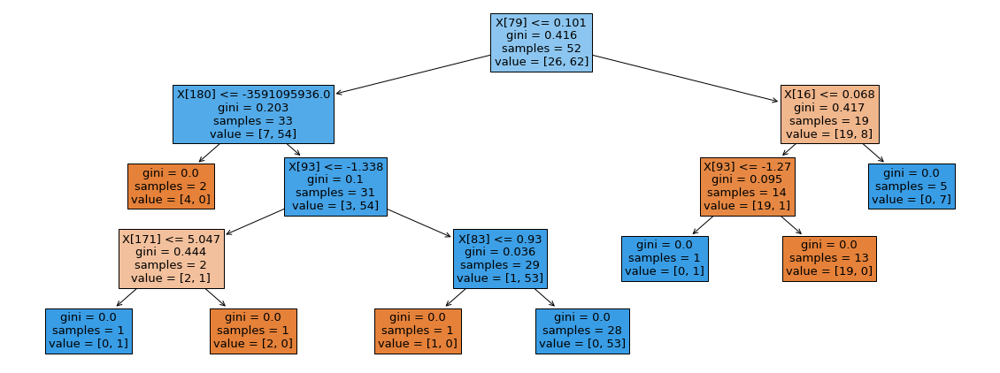

In [344]:
from sklearn import tree
plt.figure(figsize=(20,7.5))  # set plot size (denoted in inches)
tree.plot_tree(rf_classifier.estimators_[0], fontsize=13,filled=True)
plt.show()
#plt.savefig('pt2.png')

#### Standardization

In [11]:
from sklearn.preprocessing import StandardScaler
std = StandardScaler()
scaled = std.fit_transform(X) 

In [12]:
X1=pd.DataFrame(scaled)
X1

,0,1,2,3,4,5,6,7,8,9,...,300,301,302,303,304,305,306,307,308,309
0,-0.399377,-0.431252,-0.427775,-0.193158,-0.349789,-0.185255,-0.190603,-0.330321,-0.264576,0.330353,...,0.075932,0.074583,0.070217,0.085308,0.086062,0.086821,0.068374,0.070190,0.072930,0.086653
1,-0.185464,-0.343912,-0.334808,0.393032,-0.467868,-0.179726,-0.190500,0.106770,0.484146,0.164895,...,0.949230,0.958934,0.949599,0.953682,0.970554,0.959255,0.960115,0.974571,0.974684,0.994152
2,0.954598,2.920368,2.925892,-0.003139,2.967826,0.237966,0.609078,-0.274274,-0.818349,-0.060302,...,-1.928754,-1.926650,-1.945816,-1.961422,-1.977083,-2.011804,-2.041734,-2.062769,-2.049252,-2.087872
3,-0.564921,-0.512586,-0.506215,0.030217,-0.462049,-0.255734,-0.191117,-0.640630,-0.848794,0.390636,...,-1.391005,-1.397233,-1.410976,-1.400405,-1.410642,-1.410086,-1.430949,-1.445598,-1.437768,-1.443196
4,-0.434025,-0.445895,-0.512084,1.787097,0.022002,-0.234403,-0.134661,-0.242475,-0.115700,0.367279,...,-0.131061,-0.111348,-0.157913,-0.125864,-0.130483,-0.133342,-0.149523,-0.151522,-0.146653,-0.139612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,-0.317797,-0.270429,-0.259019,0.220722,-0.398413,-0.208762,-0.190198,-0.451838,-0.553700,0.296169,...,-0.493595,-0.484560,-0.483316,-0.468919,-0.473373,-0.477558,-0.478137,-0.484295,-0.481736,-0.481302
122,1.377720,1.200474,1.216387,0.573609,0.248428,-0.098426,-0.173105,0.210936,-0.131180,-0.591733,...,0.125982,0.145424,0.187983,0.195358,0.186914,0.178037,0.182456,0.171404,0.184814,0.187077
123,-0.444311,-0.380824,-0.372500,-0.292298,-0.343190,0.001946,-0.190757,-0.566649,-0.720731,0.360899,...,-0.862321,-0.868218,-0.883701,-0.885281,-0.887159,-0.889291,-0.907143,-0.917105,-0.911669,-0.904837
124,-0.331882,-0.361349,-0.349708,-0.054315,-0.428717,-0.206885,-0.190826,-0.322343,-0.263706,0.307144,...,0.108093,0.111287,0.104704,0.107924,0.113829,0.111152,0.108290,0.105485,0.103871,0.112800


## K-Nearest Neighbour

In [171]:
X_traine, X_teste, y_traine, y_teste = train_test_split(X1, y, stratify=y, test_size = 0.30, random_state=12)

In [172]:
knn = KNeighborsClassifier()
knn.fit(X_traine,y_traine)

KNeighborsClassifier()

In [174]:
pred1 = knn.predict(X_teste)
print(confusion_matrix(y_teste,pred1))
print("Accuracy Score {}".format(accuracy_score(y_teste,pred1)))
print("Classification report: {}".format(classification_report(y_teste,pred1)))
print(f1_score(y_teste, pred1, average="micro"))

[[11  2]
 [ 5 20]]
Accuracy Score 0.8157894736842105
Classification report:               precision    recall  f1-score   support

           1       0.69      0.85      0.76        13
           2       0.91      0.80      0.85        25

    accuracy                           0.82        38
   macro avg       0.80      0.82      0.80        38
weighted avg       0.83      0.82      0.82        38

0.8157894736842104


In [175]:
k_range = list(range(1,40))
weight_options = ["uniform", "distance"]
metric=["euclidean", "manhattan"]
param_grid = dict(n_neighbors = k_range, weights = weight_options, metric= metric)
grid = GridSearchCV(estimator=knn, param_grid=param_grid, cv = 10, scoring = 'accuracy', n_jobs=-1, verbose=2 )
grid.fit(X_traine,y_traine)

Fitting 10 folds for each of 156 candidates, totalling 1560 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 616 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 1560 out of 1560 | elapsed:   12.0s finished


GridSearchCV(cv=10, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30, ...],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy', verbose=2)

In [176]:
grid.best_estimator_

KNeighborsClassifier(metric='euclidean', n_neighbors=14, weights='distance')

In [177]:
knngrid=grid.best_estimator_

In [178]:
pred = knngrid.predict(X_teste)
print(confusion_matrix(y_teste,pred))
print("Accuracy Score {}".format(accuracy_score(y_teste,pred)))
print("Classification report: {}".format(classification_report(y_teste,pred)))
print(f1_score(y_teste, pred, average="micro"))

[[11  2]
 [ 3 22]]
Accuracy Score 0.868421052631579
Classification report:               precision    recall  f1-score   support

           1       0.79      0.85      0.81        13
           2       0.92      0.88      0.90        25

    accuracy                           0.87        38
   macro avg       0.85      0.86      0.86        38
weighted avg       0.87      0.87      0.87        38

0.868421052631579


### Support Vector Machine

In [13]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y, stratify=y, test_size = 0.30, random_state=14)

In [14]:
svm1= SVC(random_state=0,kernel='linear')
svm1.fit(X_train1, y_train1)

SVC(kernel='linear', random_state=0)

In [15]:
preda = svm1.predict(X_test1)
print(confusion_matrix(y_test1,preda))
print("Accuracy Score {}".format(accuracy_score(y_test1,preda)))
print("Classification report: {}".format(classification_report(y_test1,preda)))
print(f1_score(y_test1, preda, average="micro"))

[[10  3]
 [ 5 20]]
Accuracy Score 0.7894736842105263
Classification report:               precision    recall  f1-score   support

           1       0.67      0.77      0.71        13
           2       0.87      0.80      0.83        25

    accuracy                           0.79        38
   macro avg       0.77      0.78      0.77        38
weighted avg       0.80      0.79      0.79        38

0.7894736842105263


In [16]:
param_gridsvm = {'C': [ 100,200,300], 
              'gamma': [ 0.00001, 0.000001, 0.0001],
              'kernel': ['rbf','linear']} 
  
gridsvm = GridSearchCV(SVC(), param_gridsvm, n_jobs=-1, cv=5, verbose = 3)
  
# fitting the model for grid search
gridsvm.fit(X_train1, y_train1)

Fitting 5 folds for each of 18 candidates, totalling 90 fits


GridSearchCV(cv=5, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [100, 200, 300], 'gamma': [1e-05, 1e-06, 0.0001],
                         'kernel': ['rbf', 'linear']},
             verbose=3)

In [17]:
gridsvm.best_params_

{'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}

In [18]:
cap=gridsvm.best_estimator_

In [19]:
predact = cap.predict(X_test1)
print(confusion_matrix(y_test1,predact))
print("Accuracy Score {}".format(accuracy_score(y_test1,predact)))
print("Classification report: {}".format(classification_report(y_test1,predact)))

[[10  3]
 [ 4 21]]
Accuracy Score 0.8157894736842105
Classification report:               precision    recall  f1-score   support

           1       0.71      0.77      0.74        13
           2       0.88      0.84      0.86        25

    accuracy                           0.82        38
   macro avg       0.79      0.80      0.80        38
weighted avg       0.82      0.82      0.82        38



In [29]:
avg_score = np.mean(scores)
print(avg_score)

0.8642857142857143


In [265]:
# sensitivity analysis of k in k-fold cross-validation
from sklearn.model_selection import LeaveOneOut 
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
# evaluate the model using a given test condition
def evaluate_model(cv):
    # get the model
    model = cap
    # evaluate the model
    scores = cross_val_score(model, X_train1, y_train1, scoring='accuracy', cv=cv, n_jobs=-1)
    # return scores
    return mean(scores), scores.min(), scores.max()

### calculate the ideal test condition
ideal, _, _ = evaluate_model(LeaveOneOut())
print('Ideal: %.3f' % ideal)
### define folds to test
folds = range(2,31)
### record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()
### evaluate each k value
for k in folds:
    # define the test condition
    cv = KFold(n_splits=k, shuffle=True, random_state=1)
    # evaluate k value
    k_mean, k_min, k_max = evaluate_model(cv)
    # report performance
    print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
    # store mean accuracy
    means.append(k_mean)
    # store min and max relative to the mean
    mins.append(k_mean - k_min)
    maxs.append(k_max - k_mean)


Ideal: 0.864
> folds=2, accuracy=0.852 (0.818,0.886)
> folds=3, accuracy=0.863 (0.759,0.931)
> folds=4, accuracy=0.875 (0.818,0.955)
> folds=5, accuracy=0.865 (0.722,0.944)
> folds=6, accuracy=0.864 (0.667,1.000)
> folds=7, accuracy=0.853 (0.692,0.923)
> folds=8, accuracy=0.852 (0.636,1.000)
> folds=9, accuracy=0.874 (0.667,1.000)
> folds=10, accuracy=0.876 (0.667,1.000)
> folds=11, accuracy=0.875 (0.625,1.000)
> folds=12, accuracy=0.875 (0.571,1.000)
> folds=13, accuracy=0.864 (0.571,1.000)
> folds=14, accuracy=0.850 (0.571,1.000)
> folds=15, accuracy=0.876 (0.500,1.000)
> folds=16, accuracy=0.877 (0.500,1.000)
> folds=17, accuracy=0.876 (0.400,1.000)
> folds=18, accuracy=0.867 (0.400,1.000)
> folds=19, accuracy=0.866 (0.400,1.000)
> folds=20, accuracy=0.850 (0.400,1.000)
> folds=21, accuracy=0.852 (0.400,1.000)
> folds=22, accuracy=0.852 (0.500,1.000)
> folds=23, accuracy=0.855 (0.500,1.000)
> folds=24, accuracy=0.854 (0.500,1.000)
> folds=25, accuracy=0.853 (0.500,1.000)
> folds=26,

### Naive Bayes

In [34]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X1, y, stratify=y, test_size = 0.30, random_state=16)

In [35]:
NB= GaussianNB().fit(X_train2, y_train2)
predb = NB.predict(X_test2)
print(confusion_matrix(y_test2,predb))
print("Accuracy Score {}".format(accuracy_score(y_test2,predb)))
print("Classification report: {}".format(classification_report(y_test2,predb)))
print(f1_score(y_test2, predb, average="micro"))

[[12  1]
 [14 11]]
Accuracy Score 0.6052631578947368
Classification report:               precision    recall  f1-score   support

           1       0.46      0.92      0.62        13
           2       0.92      0.44      0.59        25

    accuracy                           0.61        38
   macro avg       0.69      0.68      0.60        38
weighted avg       0.76      0.61      0.60        38

0.6052631578947368


In [42]:
e=AdaBoostClassifier(NB,learning_rate=0.0000001).fit(X_train2,y_train2)
e.score(X_test2, y_test2)

0.6052631578947368

### Logistic Regression

In [14]:
X_train3, X_test3, y_train3, y_test3 = train_test_split(X1, y, stratify=y,  test_size = 0.30, random_state=18)

In [15]:
lr = LogisticRegression().fit(X_train3, y_train3)

In [16]:
predlr = lr.predict(X_test3)
print(confusion_matrix(y_test3,predlr))
print("Accuracy Score {}".format(accuracy_score(y_test3,predlr)))
print("Classification report: {}".format(classification_report(y_test3,predlr)))
print(f1_score(y_test3, predlr, average="micro"))

[[11  2]
 [ 2 23]]
Accuracy Score 0.8947368421052632
Classification report:               precision    recall  f1-score   support

           1       0.85      0.85      0.85        13
           2       0.92      0.92      0.92        25

    accuracy                           0.89        38
   macro avg       0.88      0.88      0.88        38
weighted avg       0.89      0.89      0.89        38

0.8947368421052632


In [313]:
iterations = [100,70,200,250]
#param_grid = dict(max_iter=iterations)
c_space = np.logspace(-5, 8, 30)
param_gridlr = {'C': c_space, 'max_iter':iterations}

In [314]:
gridlr = GridSearchCV(lr , param_gridlr, n_jobs=-1,verbose=5, cv=10)
gridlr.fit(X_train3, y_train3)

Fitting 10 folds for each of 120 candidates, totalling 1200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 384 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 888 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done 1200 out of 1200 | elapsed:   14.6s finished


GridSearchCV(cv=10, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.00000000e-05, 2.80721620e-05, 7.88046282e-05, 2.21221629e-04,
       6.21016942e-04, 1.74332882e-03, 4.89390092e-03, 1.37382380e-02,
       3.85662042e-02, 1.08263673e-01, 3.03919538e-01, 8.53167852e-01,
       2.39502662e+00, 6.72335754e+00, 1.88739182e+01, 5.29831691e+01,
       1.48735211e+02, 4.17531894e+02, 1.17210230e+03, 3.29034456e+03,
       9.23670857e+03, 2.59294380e+04, 7.27895384e+04, 2.04335972e+05,
       5.73615251e+05, 1.61026203e+06, 4.52035366e+06, 1.26896100e+07,
       3.56224789e+07, 1.00000000e+08]),
                         'max_iter': [100, 70, 200, 250]},
             verbose=5)

In [315]:
loki=gridlr.best_estimator_

In [316]:
loki

LogisticRegression(C=0.3039195382313195)

In [317]:
predlr1 = loki.predict(X_test3)
print(confusion_matrix(y_test3,predlr1))
print("Accuracy Score {}".format(accuracy_score(y_test3,predlr1)))
print("Classification report: {}".format(classification_report(y_test3,predlr1)))
print(f1_score(y_test3, predlr1, average="micro"))

[[ 9  4]
 [ 2 23]]
Accuracy Score 0.8421052631578947
Classification report:               precision    recall  f1-score   support

           1       0.82      0.69      0.75        13
           2       0.85      0.92      0.88        25

    accuracy                           0.84        38
   macro avg       0.84      0.81      0.82        38
weighted avg       0.84      0.84      0.84        38

0.8421052631578947


### Decision Tree

In [327]:
X_train4, X_test4, y_train4, y_test4 = train_test_split(X, y, stratify=y, test_size = 0.30, random_state=20)

In [328]:
dtree=DecisionTreeClassifier(random_state=10).fit(X_train4, y_train4)

In [329]:
preddt = dtree.predict(X_test4)
print(confusion_matrix(y_test4,preddt))
print("Accuracy Score {}".format(accuracy_score(y_test4,preddt)))
print("Classification report: {}".format(classification_report(y_test4,preddt)))
print(f1_score(y_test4, preddt, average="micro"))

[[ 8  5]
 [ 9 16]]
Accuracy Score 0.631578947368421
Classification report:               precision    recall  f1-score   support

           1       0.47      0.62      0.53        13
           2       0.76      0.64      0.70        25

    accuracy                           0.63        38
   macro avg       0.62      0.63      0.61        38
weighted avg       0.66      0.63      0.64        38

0.631578947368421


In [330]:
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid1 = {
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid1)

{'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [331]:
dtree_randomcv=GridSearchCV(estimator=dtree,param_grid=random_grid1,cv=10,verbose=2,n_jobs=-1)
### fit the randomized model
dtree_randomcv.fit(X_train4,y_train4)

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 672 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 2296 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done 4560 tasks      | elapsed:   24.3s
[Parallel(n_jobs=-1)]: Done 7480 tasks      | elapsed:   36.7s
[Parallel(n_jobs=-1)]: Done 11040 tasks      | elapsed:   51.9s
[Parallel(n_jobs=-1)]: Done 12000 out of 12000 | elapsed:   55.8s finished


GridSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=10),
             n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': [10, 120, 230, 340, 450, 560, 670, 780,
                                       890, 1000],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4, 6, 8],
                         'min_samples_split': [2, 5, 10, 14]},
             verbose=2)

In [333]:
dtree_randomcv.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 10}

In [334]:
preddt2 = dtree_randomcv.best_estimator_.predict(X_test4)
print(confusion_matrix(y_test4,preddt2))
print("Accuracy Score {}".format(accuracy_score(y_test4,preddt2)))
print("Classification report: {}".format(classification_report(y_test4,preddt2)))
print(f1_score(y_test4, preddt2, average="micro"))

[[ 8  5]
 [ 7 18]]
Accuracy Score 0.6842105263157895
Classification report:               precision    recall  f1-score   support

           1       0.53      0.62      0.57        13
           2       0.78      0.72      0.75        25

    accuracy                           0.68        38
   macro avg       0.66      0.67      0.66        38
weighted avg       0.70      0.68      0.69        38

0.6842105263157895


#### optimization with adaboost

In [337]:
c=AdaBoostClassifier(dtree_randomcv.best_estimator_).fit(X_train4,y_train4)

In [336]:
preddt23 = c.predict(X_test4)
print(confusion_matrix(y_test4,preddt23))
print("Accuracy Score {}".format(accuracy_score(y_test4,preddt23)))
print("Classification report: {}".format(classification_report(y_test4,preddt23)))
print(f1_score(y_test4, preddt23, average="micro"))

[[ 7  6]
 [ 1 24]]
Accuracy Score 0.8157894736842105
Classification report:               precision    recall  f1-score   support

           1       0.88      0.54      0.67        13
           2       0.80      0.96      0.87        25

    accuracy                           0.82        38
   macro avg       0.84      0.75      0.77        38
weighted avg       0.83      0.82      0.80        38

0.8157894736842104


## XGBoost

In [44]:
X_train5, X_test5, y_train5, y_test5 = train_test_split(X1, y, stratify=y, test_size = 0.30, random_state=22)

In [45]:
classifier1=xgb.XGBClassifier(random_state=22)

In [46]:
classifier1.fit(X_train5, y_train5)

[21:17:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=22,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [47]:
predxg = classifier1.predict(X_test5)
print(confusion_matrix(y_test5,predxg))
print("Accuracy Score {}".format(accuracy_score(y_test5,predxg)))
print("Classification report: {}".format(classification_report(y_test5,predxg)))
print(f1_score(y_test5, predxg, average="micro"))

[[ 7  6]
 [ 1 24]]
Accuracy Score 0.8157894736842105
Classification report:               precision    recall  f1-score   support

           1       0.88      0.54      0.67        13
           2       0.80      0.96      0.87        25

    accuracy                           0.82        38
   macro avg       0.84      0.75      0.77        38
weighted avg       0.83      0.82      0.80        38

0.8157894736842104


### Hyperopt

In [52]:
def objective(space):

    warnings.filterwarnings(action='ignore')
    classifier2 = xgb.XGBClassifier(n_estimators = space['n_estimators'],
                            max_depth = int(space['max_depth']),
                            learning_rate = space['learning_rate'],
                            gamma = space['gamma'],
                            min_child_weight = space['min_child_weight'],
                            subsample = space['subsample'],
                            colsample_bytree = space['colsample_bytree']
                            )
    
    classifier2.fit(X_train5, y_train5)

    # Applying k-Fold Cross Validation
    from sklearn.model_selection import cross_val_score
    #accuracies = cross_val_score(estimator = classifier2, X = X_train5, y = y_train5, cv = 10)
    accuracy = cross_val_score(classifier2, X_train5, y_train5, cv = 5).mean()

   # print("CrossValMean:", CrossValMean)
        # We aim to maximize accuracy, therefore we return it as a negative value
    return {'loss': -accuracy, 'status': STATUS_OK }
    #return{'loss':1-CrossValMean, 'status': STATUS_OK }

space = {
    'max_depth' : hp.choice('max_depth', range(5, 30, 1)),
    'learning_rate' : hp.quniform('learning_rate', 0.01, 0.5, 0.01),
    'n_estimators' : hp.choice('n_estimators', range(20, 205, 5)),
    'gamma' : hp.quniform('gamma', 0, 0.50, 0.01),
    'min_child_weight' : hp.quniform('min_child_weight', 1, 10, 1),
    'subsample' : hp.quniform('subsample', 0.1, 1, 0.01),
    'colsample_bytree' : hp.quniform('colsample_bytree', 0.1, 1.0, 0.01)}

trials = Trials()
best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=80,
            trials=trials)

print("Best: ", best)


[21:32:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:32:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:32:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:32:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:32:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:32:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:32:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:32:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:32:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:32:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:32:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:32:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:32:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:32:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:32:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:32:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:33:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:33:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:33:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:33:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:33:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:33:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:33:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:33:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:33:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:33:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:33:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:33:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:33:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:33:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:33:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:33:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:34:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:34:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:34:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:34:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:34:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:34:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:34:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:34:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:34:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:34:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:34:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:35:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:35:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:35:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:35:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:35:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:35:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:35:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:35:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:35:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:35:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:35:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:35:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:36:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:36:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:36:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:36:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:36:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:36:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:36:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:36:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[21:36:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:36:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:36:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:36:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

In [53]:
# Fitting XGBoost to the Training set
from xgboost import XGBClassifier
classifier4 = XGBClassifier(n_estimators = best['n_estimators'],
                            max_depth = best['max_depth'],
                            learning_rate = best['learning_rate'],
                            gamma = best['gamma'],
                            min_child_weight = best['min_child_weight'],
                            subsample = best['subsample'],
                            colsample_bytree = best['colsample_bytree']
                            )

classifier4.fit(X_train5, y_train5)

[21:36:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.26, gamma=0.22, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.31, max_delta_step=0, max_depth=23,
              min_child_weight=1.0, missing=nan, monotone_constraints='()',
              n_estimators=9, n_jobs=8, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=0.5700000000000001, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [54]:
predxg111 = classifier4.predict(X_test5)
print(confusion_matrix(y_test5,predxg111))
print("Accuracy Score {}".format(accuracy_score(y_test5,predxg111)))
print("Classification report: {}".format(classification_report(y_test5,predxg111)))
print(f1_score(y_test5, predxg111, average="micro"))

[[ 6  7]
 [ 0 25]]
Accuracy Score 0.8157894736842105
Classification report:               precision    recall  f1-score   support

           1       1.00      0.46      0.63        13
           2       0.78      1.00      0.88        25

    accuracy                           0.82        38
   macro avg       0.89      0.73      0.75        38
weighted avg       0.86      0.82      0.79        38

0.8157894736842104


## CatBoost

In [14]:
X_train6, X_test6, y_train6, y_test6 = train_test_split(X1, y, stratify=y, test_size = 0.30, random_state=30)

In [15]:
ca=CatBoostClassifier(random_seed = 1,custom_loss = ['Accuracy']).fit(X_train6, y_train6,eval_set=(X_test6, y_test6),  # you can uncomment this for text output
    )

Learning rate set to 0.017386
0:	learn: 0.6794675	test: 0.6854207	best: 0.6854207 (0)	total: 150ms	remaining: 2m 30s
1:	learn: 0.6668864	test: 0.6787873	best: 0.6787873 (1)	total: 161ms	remaining: 1m 20s
2:	learn: 0.6515948	test: 0.6691084	best: 0.6691084 (2)	total: 172ms	remaining: 57.3s
3:	learn: 0.6388275	test: 0.6598447	best: 0.6598447 (3)	total: 185ms	remaining: 46.1s
4:	learn: 0.6282304	test: 0.6567073	best: 0.6567073 (4)	total: 197ms	remaining: 39.2s
5:	learn: 0.6175547	test: 0.6522617	best: 0.6522617 (5)	total: 210ms	remaining: 34.7s
6:	learn: 0.6059741	test: 0.6458458	best: 0.6458458 (6)	total: 226ms	remaining: 32.1s
7:	learn: 0.5941317	test: 0.6377636	best: 0.6377636 (7)	total: 237ms	remaining: 29.4s
8:	learn: 0.5850675	test: 0.6325650	best: 0.6325650 (8)	total: 248ms	remaining: 27.3s
9:	learn: 0.5748361	test: 0.6265424	best: 0.6265424 (9)	total: 259ms	remaining: 25.6s
10:	learn: 0.5648620	test: 0.6184412	best: 0.6184412 (10)	total: 270ms	remaining: 24.3s
11:	learn: 0.5550217

98:	learn: 0.1700421	test: 0.4239141	best: 0.4239141 (98)	total: 1.28s	remaining: 11.7s
99:	learn: 0.1682006	test: 0.4229369	best: 0.4229369 (99)	total: 1.3s	remaining: 11.7s
100:	learn: 0.1658640	test: 0.4221194	best: 0.4221194 (100)	total: 1.31s	remaining: 11.6s
101:	learn: 0.1640335	test: 0.4211280	best: 0.4211280 (101)	total: 1.32s	remaining: 11.6s
102:	learn: 0.1618019	test: 0.4219677	best: 0.4211280 (101)	total: 1.33s	remaining: 11.6s
103:	learn: 0.1598707	test: 0.4210165	best: 0.4210165 (103)	total: 1.35s	remaining: 11.6s
104:	learn: 0.1585071	test: 0.4205204	best: 0.4205204 (104)	total: 1.36s	remaining: 11.6s
105:	learn: 0.1568223	test: 0.4200116	best: 0.4200116 (105)	total: 1.37s	remaining: 11.6s
106:	learn: 0.1550644	test: 0.4194394	best: 0.4194394 (106)	total: 1.38s	remaining: 11.5s
107:	learn: 0.1532655	test: 0.4181123	best: 0.4181123 (107)	total: 1.39s	remaining: 11.5s
108:	learn: 0.1517283	test: 0.4177005	best: 0.4177005 (108)	total: 1.4s	remaining: 11.5s
109:	learn: 0.15

192:	learn: 0.0722992	test: 0.3752582	best: 0.3747200 (189)	total: 2.38s	remaining: 9.94s
193:	learn: 0.0717812	test: 0.3736377	best: 0.3736377 (193)	total: 2.39s	remaining: 9.93s
194:	learn: 0.0710870	test: 0.3738823	best: 0.3736377 (193)	total: 2.4s	remaining: 9.92s
195:	learn: 0.0707865	test: 0.3735938	best: 0.3735938 (195)	total: 2.41s	remaining: 9.9s
196:	learn: 0.0701678	test: 0.3738669	best: 0.3735938 (195)	total: 2.43s	remaining: 9.9s
197:	learn: 0.0697178	test: 0.3732682	best: 0.3732682 (197)	total: 2.44s	remaining: 9.88s
198:	learn: 0.0692771	test: 0.3731292	best: 0.3731292 (198)	total: 2.45s	remaining: 9.86s
199:	learn: 0.0688931	test: 0.3726942	best: 0.3726942 (199)	total: 2.46s	remaining: 9.84s
200:	learn: 0.0684708	test: 0.3735078	best: 0.3726942 (199)	total: 2.47s	remaining: 9.82s
201:	learn: 0.0680770	test: 0.3732976	best: 0.3726942 (199)	total: 2.48s	remaining: 9.8s
202:	learn: 0.0677402	test: 0.3726002	best: 0.3726002 (202)	total: 2.49s	remaining: 9.79s
203:	learn: 0.

290:	learn: 0.0373478	test: 0.3683237	best: 0.3675473 (288)	total: 3.49s	remaining: 8.49s
291:	learn: 0.0372397	test: 0.3684593	best: 0.3675473 (288)	total: 3.5s	remaining: 8.48s
292:	learn: 0.0369214	test: 0.3685904	best: 0.3675473 (288)	total: 3.51s	remaining: 8.47s
293:	learn: 0.0366633	test: 0.3691702	best: 0.3675473 (288)	total: 3.52s	remaining: 8.46s
294:	learn: 0.0364258	test: 0.3688385	best: 0.3675473 (288)	total: 3.54s	remaining: 8.45s
295:	learn: 0.0362212	test: 0.3690306	best: 0.3675473 (288)	total: 3.55s	remaining: 8.44s
296:	learn: 0.0358739	test: 0.3698271	best: 0.3675473 (288)	total: 3.56s	remaining: 8.42s
297:	learn: 0.0355867	test: 0.3693970	best: 0.3675473 (288)	total: 3.57s	remaining: 8.41s
298:	learn: 0.0352803	test: 0.3683094	best: 0.3675473 (288)	total: 3.58s	remaining: 8.39s
299:	learn: 0.0350178	test: 0.3694065	best: 0.3675473 (288)	total: 3.59s	remaining: 8.38s
300:	learn: 0.0348605	test: 0.3694413	best: 0.3675473 (288)	total: 3.6s	remaining: 8.36s
301:	learn: 

383:	learn: 0.0211587	test: 0.3760352	best: 0.3675473 (288)	total: 4.56s	remaining: 7.31s
384:	learn: 0.0210594	test: 0.3762956	best: 0.3675473 (288)	total: 4.57s	remaining: 7.3s
385:	learn: 0.0208735	test: 0.3770342	best: 0.3675473 (288)	total: 4.58s	remaining: 7.29s
386:	learn: 0.0206666	test: 0.3776777	best: 0.3675473 (288)	total: 4.59s	remaining: 7.28s
387:	learn: 0.0205695	test: 0.3777686	best: 0.3675473 (288)	total: 4.61s	remaining: 7.26s
388:	learn: 0.0204409	test: 0.3781260	best: 0.3675473 (288)	total: 4.62s	remaining: 7.25s
389:	learn: 0.0203123	test: 0.3781974	best: 0.3675473 (288)	total: 4.63s	remaining: 7.24s
390:	learn: 0.0202390	test: 0.3783242	best: 0.3675473 (288)	total: 4.64s	remaining: 7.23s
391:	learn: 0.0201418	test: 0.3781707	best: 0.3675473 (288)	total: 4.65s	remaining: 7.21s
392:	learn: 0.0200339	test: 0.3786713	best: 0.3675473 (288)	total: 4.66s	remaining: 7.2s
393:	learn: 0.0199281	test: 0.3788422	best: 0.3675473 (288)	total: 4.67s	remaining: 7.19s
394:	learn: 

477:	learn: 0.0138881	test: 0.3865881	best: 0.3675473 (288)	total: 5.65s	remaining: 6.17s
478:	learn: 0.0138455	test: 0.3867040	best: 0.3675473 (288)	total: 5.66s	remaining: 6.15s
479:	learn: 0.0138017	test: 0.3868640	best: 0.3675473 (288)	total: 5.67s	remaining: 6.14s
480:	learn: 0.0137499	test: 0.3868906	best: 0.3675473 (288)	total: 5.68s	remaining: 6.13s
481:	learn: 0.0137099	test: 0.3868929	best: 0.3675473 (288)	total: 5.69s	remaining: 6.12s
482:	learn: 0.0136651	test: 0.3871028	best: 0.3675473 (288)	total: 5.71s	remaining: 6.11s
483:	learn: 0.0136215	test: 0.3871851	best: 0.3675473 (288)	total: 5.72s	remaining: 6.09s
484:	learn: 0.0135780	test: 0.3872705	best: 0.3675473 (288)	total: 5.73s	remaining: 6.08s
485:	learn: 0.0135356	test: 0.3873587	best: 0.3675473 (288)	total: 5.74s	remaining: 6.07s
486:	learn: 0.0134927	test: 0.3874416	best: 0.3675473 (288)	total: 5.75s	remaining: 6.06s
487:	learn: 0.0134490	test: 0.3876491	best: 0.3675473 (288)	total: 5.77s	remaining: 6.05s
488:	learn

571:	learn: 0.0107541	test: 0.3949509	best: 0.3675473 (288)	total: 6.75s	remaining: 5.05s
572:	learn: 0.0107318	test: 0.3950597	best: 0.3675473 (288)	total: 6.76s	remaining: 5.04s
573:	learn: 0.0107097	test: 0.3951685	best: 0.3675473 (288)	total: 6.78s	remaining: 5.03s
574:	learn: 0.0106882	test: 0.3952508	best: 0.3675473 (288)	total: 6.79s	remaining: 5.02s
575:	learn: 0.0106668	test: 0.3953333	best: 0.3675473 (288)	total: 6.8s	remaining: 5.01s
576:	learn: 0.0106423	test: 0.3953719	best: 0.3675473 (288)	total: 6.81s	remaining: 4.99s
577:	learn: 0.0106116	test: 0.3953235	best: 0.3675473 (288)	total: 6.82s	remaining: 4.98s
578:	learn: 0.0105818	test: 0.3952838	best: 0.3675473 (288)	total: 6.83s	remaining: 4.97s
579:	learn: 0.0105603	test: 0.3953682	best: 0.3675473 (288)	total: 6.85s	remaining: 4.96s
580:	learn: 0.0105289	test: 0.3953028	best: 0.3675473 (288)	total: 6.86s	remaining: 4.95s
581:	learn: 0.0105076	test: 0.3954121	best: 0.3675473 (288)	total: 6.87s	remaining: 4.93s
582:	learn:

665:	learn: 0.0088115	test: 0.3998785	best: 0.3675473 (288)	total: 7.84s	remaining: 3.93s
666:	learn: 0.0087971	test: 0.3999866	best: 0.3675473 (288)	total: 7.85s	remaining: 3.92s
667:	learn: 0.0087831	test: 0.4000752	best: 0.3675473 (288)	total: 7.86s	remaining: 3.91s
668:	learn: 0.0087688	test: 0.4001832	best: 0.3675473 (288)	total: 7.87s	remaining: 3.89s
669:	learn: 0.0087495	test: 0.4001891	best: 0.3675473 (288)	total: 7.88s	remaining: 3.88s
670:	learn: 0.0087302	test: 0.4001960	best: 0.3675473 (288)	total: 7.89s	remaining: 3.87s
671:	learn: 0.0087164	test: 0.4002845	best: 0.3675473 (288)	total: 7.91s	remaining: 3.86s
672:	learn: 0.0087027	test: 0.4003731	best: 0.3675473 (288)	total: 7.92s	remaining: 3.85s
673:	learn: 0.0086836	test: 0.4003809	best: 0.3675473 (288)	total: 7.93s	remaining: 3.83s
674:	learn: 0.0086700	test: 0.4004695	best: 0.3675473 (288)	total: 7.94s	remaining: 3.82s
675:	learn: 0.0086507	test: 0.4004709	best: 0.3675473 (288)	total: 7.95s	remaining: 3.81s
676:	learn

760:	learn: 0.0073950	test: 0.4072724	best: 0.3675473 (288)	total: 8.93s	remaining: 2.8s
761:	learn: 0.0073819	test: 0.4073036	best: 0.3675473 (288)	total: 8.94s	remaining: 2.79s
762:	learn: 0.0073688	test: 0.4073351	best: 0.3675473 (288)	total: 8.95s	remaining: 2.78s
763:	learn: 0.0073531	test: 0.4075601	best: 0.3675473 (288)	total: 8.96s	remaining: 2.77s
764:	learn: 0.0073402	test: 0.4075920	best: 0.3675473 (288)	total: 8.97s	remaining: 2.76s
765:	learn: 0.0073246	test: 0.4077524	best: 0.3675473 (288)	total: 8.98s	remaining: 2.74s
766:	learn: 0.0073118	test: 0.4077848	best: 0.3675473 (288)	total: 9s	remaining: 2.73s
767:	learn: 0.0072964	test: 0.4079451	best: 0.3675473 (288)	total: 9.01s	remaining: 2.72s
768:	learn: 0.0072837	test: 0.4079779	best: 0.3675473 (288)	total: 9.02s	remaining: 2.71s
769:	learn: 0.0072710	test: 0.4080109	best: 0.3675473 (288)	total: 9.03s	remaining: 2.7s
770:	learn: 0.0072617	test: 0.4080961	best: 0.3675473 (288)	total: 9.04s	remaining: 2.69s
771:	learn: 0.0

860:	learn: 0.0062506	test: 0.4163035	best: 0.3675473 (288)	total: 10s	remaining: 1.62s
861:	learn: 0.0062424	test: 0.4163775	best: 0.3675473 (288)	total: 10.1s	remaining: 1.61s
862:	learn: 0.0062334	test: 0.4164212	best: 0.3675473 (288)	total: 10.1s	remaining: 1.6s
863:	learn: 0.0062200	test: 0.4162856	best: 0.3675473 (288)	total: 10.1s	remaining: 1.58s
864:	learn: 0.0062119	test: 0.4163597	best: 0.3675473 (288)	total: 10.1s	remaining: 1.57s
865:	learn: 0.0062030	test: 0.4164034	best: 0.3675473 (288)	total: 10.1s	remaining: 1.56s
866:	learn: 0.0061950	test: 0.4164776	best: 0.3675473 (288)	total: 10.1s	remaining: 1.55s
867:	learn: 0.0061862	test: 0.4165217	best: 0.3675473 (288)	total: 10.1s	remaining: 1.54s
868:	learn: 0.0061782	test: 0.4165960	best: 0.3675473 (288)	total: 10.1s	remaining: 1.53s
869:	learn: 0.0061685	test: 0.4166791	best: 0.3675473 (288)	total: 10.1s	remaining: 1.51s
870:	learn: 0.0061606	test: 0.4167536	best: 0.3675473 (288)	total: 10.2s	remaining: 1.5s
871:	learn: 0.

955:	learn: 0.0054799	test: 0.4217990	best: 0.3675473 (288)	total: 11.1s	remaining: 512ms
956:	learn: 0.0054725	test: 0.4218903	best: 0.3675473 (288)	total: 11.1s	remaining: 500ms
957:	learn: 0.0054665	test: 0.4219677	best: 0.3675473 (288)	total: 11.2s	remaining: 489ms
958:	learn: 0.0054591	test: 0.4220511	best: 0.3675473 (288)	total: 11.2s	remaining: 477ms
959:	learn: 0.0054481	test: 0.4221255	best: 0.3675473 (288)	total: 11.2s	remaining: 466ms
960:	learn: 0.0054422	test: 0.4222028	best: 0.3675473 (288)	total: 11.2s	remaining: 454ms
961:	learn: 0.0054363	test: 0.4222802	best: 0.3675473 (288)	total: 11.2s	remaining: 443ms
962:	learn: 0.0054290	test: 0.4223712	best: 0.3675473 (288)	total: 11.2s	remaining: 431ms
963:	learn: 0.0054231	test: 0.4224486	best: 0.3675473 (288)	total: 11.2s	remaining: 420ms
964:	learn: 0.0054159	test: 0.4225322	best: 0.3675473 (288)	total: 11.3s	remaining: 408ms
965:	learn: 0.0054101	test: 0.4226096	best: 0.3675473 (288)	total: 11.3s	remaining: 397ms
966:	learn

In [16]:
predcat = ca.predict(X_test6)
print(confusion_matrix(y_test6,predcat))
print("Accuracy Score {}".format(accuracy_score(y_test6,predcat)))
print("Classification report: {}".format(classification_report(y_test6,predcat)))
print(f1_score(y_test6, predcat, average="micro"))

[[ 9  4]
 [ 2 23]]
Accuracy Score 0.8421052631578947
Classification report:               precision    recall  f1-score   support

           1       0.82      0.69      0.75        13
           2       0.85      0.92      0.88        25

    accuracy                           0.84        38
   macro avg       0.84      0.81      0.82        38
weighted avg       0.84      0.84      0.84        38

0.8421052631578947


In [154]:
abc=CatBoostClassifier(objective= 'Logloss',
    colsample_bylevel= 0.04938235074111109,
    depth= 8,
    boosting_type= 'Plain',
    bootstrap_type= 'Bernoulli',
    subsample= 0.9429826889381467,
    early_stopping_rounds=100,
    custom_loss = ['Accuracy'],
    learning_rate = 0.05,                   
    random_seed = 30,
    l2_leaf_reg = 7,
    iterations = 1000,fold_len_multiplier = 30)

In [155]:
abc.fit(
    X_train6, y_train6,
    eval_set=(X_test6, y_test6),  # you can uncomment this for text output
    plot = True
)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6750856	test: 0.6866076	best: 0.6866076 (0)	total: 26.5ms	remaining: 26.5s
1:	learn: 0.6549146	test: 0.6776748	best: 0.6776748 (1)	total: 55.4ms	remaining: 27.7s
2:	learn: 0.6406442	test: 0.6675455	best: 0.6675455 (2)	total: 87.9ms	remaining: 29.2s
3:	learn: 0.6235126	test: 0.6614054	best: 0.6614054 (3)	total: 108ms	remaining: 26.8s
4:	learn: 0.6049146	test: 0.6520366	best: 0.6520366 (4)	total: 131ms	remaining: 26.1s
5:	learn: 0.5880887	test: 0.6452611	best: 0.6452611 (5)	total: 144ms	remaining: 23.9s
6:	learn: 0.5758433	test: 0.6394178	best: 0.6394178 (6)	total: 157ms	remaining: 22.2s
7:	learn: 0.5587492	test: 0.6303397	best: 0.6303397 (7)	total: 169ms	remaining: 20.9s
8:	learn: 0.5449191	test: 0.6222285	best: 0.6222285 (8)	total: 191ms	remaining: 21s
9:	learn: 0.5307433	test: 0.6121498	best: 0.6121498 (9)	total: 203ms	remaining: 20.1s
10:	learn: 0.5145508	test: 0.6043920	best: 0.6043920 (10)	total: 219ms	remaining: 19.7s
11:	learn: 0.5015999	test: 0.6008417	best: 0.600841

95:	learn: 0.1172461	test: 0.4450403	best: 0.4450403 (95)	total: 1.68s	remaining: 15.8s
96:	learn: 0.1159894	test: 0.4450528	best: 0.4450403 (95)	total: 1.7s	remaining: 15.8s
97:	learn: 0.1142904	test: 0.4457635	best: 0.4450403 (95)	total: 1.72s	remaining: 15.9s
98:	learn: 0.1131059	test: 0.4457639	best: 0.4450403 (95)	total: 1.75s	remaining: 15.9s
99:	learn: 0.1117908	test: 0.4448203	best: 0.4448203 (99)	total: 1.79s	remaining: 16.1s
100:	learn: 0.1103768	test: 0.4429792	best: 0.4429792 (100)	total: 1.8s	remaining: 16s
101:	learn: 0.1084595	test: 0.4432142	best: 0.4429792 (100)	total: 1.81s	remaining: 16s
102:	learn: 0.1071636	test: 0.4427209	best: 0.4427209 (102)	total: 1.82s	remaining: 15.9s
103:	learn: 0.1058824	test: 0.4422639	best: 0.4422639 (103)	total: 1.85s	remaining: 16s
104:	learn: 0.1044463	test: 0.4417346	best: 0.4417346 (104)	total: 1.86s	remaining: 15.9s
105:	learn: 0.1031038	test: 0.4410173	best: 0.4410173 (105)	total: 1.88s	remaining: 15.8s
106:	learn: 0.1017624	test: 

196:	learn: 0.0456479	test: 0.3956409	best: 0.3956409 (196)	total: 3.29s	remaining: 13.4s
197:	learn: 0.0453773	test: 0.3948967	best: 0.3948967 (197)	total: 3.31s	remaining: 13.4s
198:	learn: 0.0450940	test: 0.3942871	best: 0.3942871 (198)	total: 3.33s	remaining: 13.4s
199:	learn: 0.0448002	test: 0.3941374	best: 0.3941374 (199)	total: 3.34s	remaining: 13.4s
200:	learn: 0.0445940	test: 0.3937618	best: 0.3937618 (200)	total: 3.35s	remaining: 13.3s
201:	learn: 0.0442318	test: 0.3927006	best: 0.3927006 (201)	total: 3.36s	remaining: 13.3s
202:	learn: 0.0439421	test: 0.3921677	best: 0.3921677 (202)	total: 3.39s	remaining: 13.3s
203:	learn: 0.0436663	test: 0.3921817	best: 0.3921677 (202)	total: 3.4s	remaining: 13.3s
204:	learn: 0.0433938	test: 0.3918418	best: 0.3918418 (204)	total: 3.41s	remaining: 13.2s
205:	learn: 0.0431262	test: 0.3914513	best: 0.3914513 (205)	total: 3.43s	remaining: 13.2s
206:	learn: 0.0428376	test: 0.3908555	best: 0.3908555 (206)	total: 3.45s	remaining: 13.2s
207:	learn:

297:	learn: 0.0263799	test: 0.3770769	best: 0.3770769 (297)	total: 5.08s	remaining: 12s
298:	learn: 0.0262034	test: 0.3761890	best: 0.3761890 (298)	total: 5.1s	remaining: 12s
299:	learn: 0.0261288	test: 0.3760192	best: 0.3760192 (299)	total: 5.12s	remaining: 11.9s
300:	learn: 0.0260277	test: 0.3757888	best: 0.3757888 (300)	total: 5.13s	remaining: 11.9s
301:	learn: 0.0259457	test: 0.3757340	best: 0.3757340 (301)	total: 5.15s	remaining: 11.9s
302:	learn: 0.0257444	test: 0.3755374	best: 0.3755374 (302)	total: 5.19s	remaining: 11.9s
303:	learn: 0.0255525	test: 0.3756640	best: 0.3755374 (302)	total: 5.21s	remaining: 11.9s
304:	learn: 0.0254603	test: 0.3757727	best: 0.3755374 (302)	total: 5.23s	remaining: 11.9s
305:	learn: 0.0253763	test: 0.3759846	best: 0.3755374 (302)	total: 5.25s	remaining: 11.9s
306:	learn: 0.0252964	test: 0.3759009	best: 0.3755374 (302)	total: 5.29s	remaining: 11.9s
307:	learn: 0.0252273	test: 0.3759754	best: 0.3755374 (302)	total: 5.3s	remaining: 11.9s
308:	learn: 0.02

398:	learn: 0.0181191	test: 0.3738847	best: 0.3738847 (398)	total: 7.1s	remaining: 10.7s
399:	learn: 0.0180668	test: 0.3740074	best: 0.3738847 (398)	total: 7.12s	remaining: 10.7s
400:	learn: 0.0179803	test: 0.3740581	best: 0.3738847 (398)	total: 7.13s	remaining: 10.7s
401:	learn: 0.0179416	test: 0.3740375	best: 0.3738847 (398)	total: 7.15s	remaining: 10.6s
402:	learn: 0.0178923	test: 0.3739370	best: 0.3738847 (398)	total: 7.16s	remaining: 10.6s
403:	learn: 0.0178416	test: 0.3738167	best: 0.3738167 (403)	total: 7.18s	remaining: 10.6s
404:	learn: 0.0178098	test: 0.3737809	best: 0.3737809 (404)	total: 7.19s	remaining: 10.6s
405:	learn: 0.0177606	test: 0.3735635	best: 0.3735635 (405)	total: 7.21s	remaining: 10.5s
406:	learn: 0.0177088	test: 0.3734336	best: 0.3734336 (406)	total: 7.22s	remaining: 10.5s
407:	learn: 0.0176709	test: 0.3732712	best: 0.3732712 (407)	total: 7.24s	remaining: 10.5s
408:	learn: 0.0176311	test: 0.3731293	best: 0.3731293 (408)	total: 7.25s	remaining: 10.5s
409:	learn:

495:	learn: 0.0137415	test: 0.3707442	best: 0.3696715 (483)	total: 9.15s	remaining: 9.3s
496:	learn: 0.0137188	test: 0.3707187	best: 0.3696715 (483)	total: 9.17s	remaining: 9.28s
497:	learn: 0.0136903	test: 0.3708927	best: 0.3696715 (483)	total: 9.21s	remaining: 9.29s
498:	learn: 0.0136489	test: 0.3706948	best: 0.3696715 (483)	total: 9.23s	remaining: 9.27s
499:	learn: 0.0136137	test: 0.3705857	best: 0.3696715 (483)	total: 9.25s	remaining: 9.25s
500:	learn: 0.0135907	test: 0.3705732	best: 0.3696715 (483)	total: 9.27s	remaining: 9.24s
501:	learn: 0.0135584	test: 0.3705003	best: 0.3696715 (483)	total: 9.3s	remaining: 9.23s
502:	learn: 0.0135170	test: 0.3704023	best: 0.3696715 (483)	total: 9.31s	remaining: 9.2s
503:	learn: 0.0134893	test: 0.3703873	best: 0.3696715 (483)	total: 9.32s	remaining: 9.18s
504:	learn: 0.0134475	test: 0.3700437	best: 0.3696715 (483)	total: 9.34s	remaining: 9.15s
505:	learn: 0.0133914	test: 0.3698212	best: 0.3696715 (483)	total: 9.36s	remaining: 9.14s
506:	learn: 0

588:	learn: 0.0112260	test: 0.3675757	best: 0.3672110 (567)	total: 11s	remaining: 7.65s
589:	learn: 0.0112060	test: 0.3676947	best: 0.3672110 (567)	total: 11s	remaining: 7.63s
590:	learn: 0.0111952	test: 0.3676255	best: 0.3672110 (567)	total: 11s	remaining: 7.61s
591:	learn: 0.0111652	test: 0.3676220	best: 0.3672110 (567)	total: 11s	remaining: 7.59s
592:	learn: 0.0111476	test: 0.3675834	best: 0.3672110 (567)	total: 11s	remaining: 7.57s
593:	learn: 0.0111291	test: 0.3674258	best: 0.3672110 (567)	total: 11s	remaining: 7.55s
594:	learn: 0.0111038	test: 0.3672513	best: 0.3672110 (567)	total: 11.1s	remaining: 7.53s
595:	learn: 0.0110679	test: 0.3674069	best: 0.3672110 (567)	total: 11.1s	remaining: 7.5s
596:	learn: 0.0110496	test: 0.3672370	best: 0.3672110 (567)	total: 11.1s	remaining: 7.49s
597:	learn: 0.0110386	test: 0.3672534	best: 0.3672110 (567)	total: 11.1s	remaining: 7.46s
598:	learn: 0.0110176	test: 0.3672300	best: 0.3672110 (567)	total: 11.1s	remaining: 7.44s
599:	learn: 0.0109957	t

687:	learn: 0.0094080	test: 0.3672707	best: 0.3660312 (652)	total: 12.6s	remaining: 5.7s
688:	learn: 0.0093930	test: 0.3672105	best: 0.3660312 (652)	total: 12.6s	remaining: 5.69s
689:	learn: 0.0093790	test: 0.3672892	best: 0.3660312 (652)	total: 12.6s	remaining: 5.67s
690:	learn: 0.0093653	test: 0.3673030	best: 0.3660312 (652)	total: 12.6s	remaining: 5.65s
691:	learn: 0.0093508	test: 0.3673656	best: 0.3660312 (652)	total: 12.6s	remaining: 5.63s
692:	learn: 0.0093390	test: 0.3673286	best: 0.3660312 (652)	total: 12.7s	remaining: 5.61s
693:	learn: 0.0093311	test: 0.3673250	best: 0.3660312 (652)	total: 12.7s	remaining: 5.59s
694:	learn: 0.0093119	test: 0.3675108	best: 0.3660312 (652)	total: 12.7s	remaining: 5.57s
695:	learn: 0.0092990	test: 0.3675465	best: 0.3660312 (652)	total: 12.7s	remaining: 5.55s
696:	learn: 0.0092748	test: 0.3676220	best: 0.3660312 (652)	total: 12.7s	remaining: 5.53s
697:	learn: 0.0092618	test: 0.3676120	best: 0.3660312 (652)	total: 12.7s	remaining: 5.51s
698:	learn:

In [156]:
predcat12 = abc.predict(X_test6)
print(confusion_matrix(y_test6,predcat12))
print("Accuracy Score {}".format(accuracy_score(y_test6,predcat12)))
print("Classification report: {}".format(classification_report(y_test6,predcat12)))
print(f1_score(y_test6, predcat12, average="micro"))

[[10  3]
 [ 1 24]]
Accuracy Score 0.8947368421052632
Classification report:               precision    recall  f1-score   support

           1       0.91      0.77      0.83        13
           2       0.89      0.96      0.92        25

    accuracy                           0.89        38
   macro avg       0.90      0.86      0.88        38
weighted avg       0.90      0.89      0.89        38

0.8947368421052632
